In [2]:
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score
import pandas as pd

## Load, Aggregate, and Shape Data into Train and Test Sets

In [3]:
### CURRENTLY ONLY FOR THE 2018 SEASON !!! EASY TO EXPAND ###

yCSV = pd.read_csv("Y_data.csv")
xCSV = pd.read_csv("avypro_training_data.csv")

# Match input data to output data by date.
data = pd.merge(xCSV, yCSV, how='inner')
data.fillna(0)
# Separate back into Y and X data.
Y_data = data.iloc[:, 60:74]
X_data = data.iloc[:, 1:60]

In [4]:
Y_data.head()

,size,likelihood,type,atl,ntl,btl,N,NE,E,SE,S,SW,W,NW
0,2,1,1,1,1,1,1,1,1,1,0,0,0,1
1,2,1,2,1,1,1,1,0,0,0,0,0,0,0
2,2,1,1,1,1,1,1,1,1,1,0,0,0,1
3,2,2,1,2,2,2,1,1,1,1,1,0,0,1
4,2,1,1,1,1,1,1,1,1,1,1,1,1,1


In [5]:
X_data.head()

,weasd,air,albedo,lftx4,ccond,cfrzr,cicep,crain,csnow,cape,...,vstm,vwnd,wcinc,wcconv,wcvflx,wcuflx,wvinc,wvconv,wvvflx,wvuflx
0,3.689453,273.513881,22.041667,4.069513,0.001121,0.0,0.0,0.069444,0.194444,2.638889,...,1.761612,3.812396,0.142164,0.269016,27053.009778,52298.722222,0.295112,-0.852878,5.023065e+05,9.125842e+05
1,4.183485,273.840542,22.519445,6.945900,0.001442,0.0,0.0,0.000000,0.027778,0.000000,...,8.467294,4.556467,0.001873,0.099577,12529.501956,18176.009222,0.003210,-0.012544,4.664435e+05,3.961722e+05
2,5.218750,274.311788,26.236112,4.398923,0.001194,0.0,0.0,0.055556,0.069444,0.833333,...,20.272773,5.771789,0.033427,0.495635,50384.602000,29193.199222,0.063256,0.913484,1.029357e+06,4.004341e+05
3,21.324544,271.524231,38.084722,4.569698,0.000942,0.0,0.0,0.111111,0.625000,12.916667,...,-12.230935,2.061167,0.303431,0.181651,-18458.371111,82082.132222,0.644174,0.571547,-2.571857e+05,8.055341e+05
4,26.901476,271.461487,40.956945,7.268658,0.001065,0.0,0.0,0.152778,0.361111,2.638889,...,-25.905458,1.417704,0.022783,0.034756,-106715.221111,95791.171111,-0.002071,-1.273638,-1.669190e+06,1.650360e+06


In [6]:
# Copy the data over to new df.
X_scaled = X_data.copy()
X_scaled = X_scaled.fillna(0)

# Normalize our features.
# for column in X_scaled.columns:
#     X_scaled[column] = (X_scaled[column] -
#                         X_scaled[column].mean()) / X_scaled[column].std()
scaler = StandardScaler()
scaler.fit(X_scaled)
X_scaled = scaler.transform(X_scaled)
X_scaled = pd.DataFrame(X_scaled)
X_scaled = X_scaled.fillna(0)
X_scaled.head()
print(X_scaled.shape)
print(Y_data.shape)

(578, 59)
(578, 14)


In [7]:
# Split data into training and testing subsets.
X_train, X_test, y_train, y_test = train_test_split(X_scaled, Y_data, test_size=0.30)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


(404, 59)
(174, 59)
(404, 14)
(174, 14)


## Generate SVM OneVsRest Models

### Size

In [8]:
# Isolate size feature and generate model.
y_size = y_train['size']
size_model = svm.SVC()
size_ovr = OneVsRestClassifier(size_model).fit(X_train, y_size)
size_preds = size_ovr.predict(X_test)
size_preds

array([2, 2, 1, 1, 1, 1, 1, 1, 2, 0, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 0, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 2, 0, 1, 0, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 1, 2, 1, 0, 1, 1, 1, 1, 1, 1, 0, 2, 1, 2, 1, 1, 0, 1, 1, 2,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 2, 1, 1, 1, 2, 2, 0, 2, 2, 2, 1, 2, 0, 1,
       1, 1, 1, 2, 0, 1, 1, 1, 0, 1, 1, 0, 0, 2, 0, 1, 1, 0, 2, 1],
      dtype=int64)

In [9]:
# Calculate accuracy with y_test.
accuracy_score(y_test['size'], size_preds)


0.6551724137931034

### Likelihood

In [10]:
# Isolate likelihood feature and generate model.
y_likelihood = y_train['likelihood']
likelihood_model = svm.SVC()
likelihood_ovr = OneVsRestClassifier(likelihood_model).fit(X_train, y_likelihood)
likelihood_preds = likelihood_ovr.predict(X_test)
likelihood_preds

array([1, 2, 1, 1, 1, 1, 1, 1, 2, 0, 1, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 1, 3, 1, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 3, 1, 1, 0, 1, 1, 2,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 0, 2, 1, 1, 1, 1, 1, 2, 1, 3, 1, 2, 0, 2, 0, 1,
       1, 1, 1, 3, 0, 1, 1, 1, 1, 1, 1, 0, 1, 2, 0, 1, 1, 1, 2, 1],
      dtype=int64)

In [11]:
# Calculate accuracy with y_test.
accuracy_score(y_test['likelihood'], likelihood_preds)

0.6609195402298851

### Problem Type

In [12]:
# Isolate problem type feature and generate model.
y_type = y_train['type']
type_model = svm.SVC()
type_ovr = OneVsRestClassifier(type_model).fit(X_train, y_type)
type_preds = type_ovr.predict(X_test)
type_preds

array([1, 1, 1, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 3,
       1, 1, 1, 1, 0, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3,
       3, 3, 1, 1, 0, 1, 1, 0, 3, 1, 3, 1, 3, 3, 3, 1, 1, 1, 1, 1, 1, 3,
       3, 3, 1, 3, 3, 1, 1, 1, 3, 1, 1, 1, 1, 3, 1, 3, 3, 1, 0, 1, 1, 1,
       1, 1, 3, 1, 3, 3, 1, 1, 1, 1, 3, 3, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 1, 1, 3, 1,
       3, 1, 1, 3, 3, 3, 0, 1, 1, 1, 3, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 3, 3, 1, 1, 1, 3, 3, 0, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype=int64)

In [13]:
# Calculate accuracy with y_test.
accuracy_score(y_test['type'], type_preds)

0.735632183908046

### Above Treeline Risk

In [14]:
# Isolate atl feature and generate model.
y_atl = y_train['atl']
atl_model = svm.SVC()
atl_ovr = OneVsRestClassifier(atl_model).fit(X_train, y_atl)
atl_preds = atl_ovr.predict(X_test)
atl_preds

array([1, 2, 1, 1, 1, 1, 1, 1, 2, 0, 1, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 1, 2, 1, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 3, 1, 1, 0, 1, 1, 2,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 2, 2, 1, 1, 1, 1, 2, 1, 3, 2, 2, 0, 2, 0, 1,
       1, 1, 1, 3, 0, 1, 1, 1, 1, 1, 1, 0, 1, 2, 0, 1, 1, 1, 2, 1],
      dtype=int64)

In [15]:
# Calculate accuracy with y_test.
accuracy_score(y_test['atl'], atl_preds)

0.6724137931034483

### Near Treeline Risk

In [16]:
# Isolate ntl feature and generate model.
y_ntl = y_train['ntl']
ntl_model = svm.SVC()
ntl_ovr = OneVsRestClassifier(ntl_model).fit(X_train, y_ntl)
ntl_preds = ntl_ovr.predict(X_test)
ntl_preds

array([1, 2, 1, 1, 1, 1, 1, 1, 2, 0, 1, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 1, 2, 1, 0, 3, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 3, 1, 1, 0, 1, 1, 2,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 2, 1, 1, 1, 1, 2, 1, 3, 2, 2, 0, 2, 0, 1,
       1, 1, 1, 3, 0, 1, 1, 1, 1, 1, 1, 0, 1, 2, 0, 1, 1, 1, 2, 1],
      dtype=int64)

In [17]:
# Calculate accuracy with y_test.
accuracy_score(y_test['ntl'], ntl_preds)

0.6666666666666666

### Below Treeline Risk

In [18]:
# Isolate atl feature and generate model.
y_btl = y_train['btl']
btl_model = svm.SVC()
btl_ovr = OneVsRestClassifier(btl_model).fit(X_train, y_btl)
btl_preds = btl_ovr.predict(X_test)
btl_preds

array([2, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 2, 0, 2, 1, 0, 1, 1, 0, 0, 0, 1,
       2, 1, 2, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 2, 0, 0, 0, 1,
       1, 1, 0, 0, 0, 1, 2, 0, 1, 0, 0, 1, 1, 1, 1, 2, 0, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 2, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0,
       0, 2, 0, 2, 1, 0, 0, 1, 0, 0, 1, 1, 0, 2, 0, 2, 0, 1, 0, 0, 0, 2,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 2, 2, 0, 3, 2, 2, 0, 2, 0, 0,
       0, 1, 0, 3, 0, 0, 1, 1, 0, 0, 1, 0, 0, 2, 0, 0, 1, 0, 1, 0],
      dtype=int64)

In [19]:
# Calculate accuracy with y_test.
accuracy_score(y_test['btl'], btl_preds)

0.6436781609195402

### Aspect

In [20]:
y_train.head()

,size,likelihood,type,atl,ntl,btl,N,NE,E,SE,S,SW,W,NW
101,1,1,3,1,1,1,1,1,1,1,1,1,1,1
312,2,2,1,2,2,2,1,1,1,1,0,0,0,1
163,0,0,0,0,0,0,1,1,1,1,1,1,1,1
254,1,1,3,1,1,1,1,1,1,1,1,1,1,1
513,0,0,3,1,1,1,0,0,1,1,1,1,1,0


In [21]:
aspect = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']

In [22]:
# Format test set.
y_train_asp = y_train.iloc[:, 6:14]
y_test_asp = y_test.iloc[:, 6:14]

for feature in aspect:
    model = svm.SVC()
    model.fit(X_train, y_train_asp[feature])
    preds = model.predict(X_test)
    score = accuracy_score(y_test[feature], preds)
    print(feature + ": ", score)

N:  0.9252873563218391
NE:  0.9137931034482759
E:  0.9252873563218391
SE:  0.9252873563218391
S:  0.8103448275862069
SW:  0.8103448275862069
W:  0.7931034482758621
NW:  0.9482758620689655


Decision Tree Classifier

Avalanche Size

[Text(0.5403567394578314, 0.9642857142857143, 'X[55] <= 0.329\ngini = 0.6\nsamples = 404\nvalue = [82, 219, 103]'),
 Text(0.18161709337349397, 0.8928571428571429, 'X[34] <= -0.913\ngini = 0.554\nsamples = 346\nvalue = [81, 209, 56]'),
 Text(0.04819277108433735, 0.8214285714285714, 'X[35] <= -0.548\ngini = 0.206\nsamples = 71\nvalue = [4, 63, 4]'),
 Text(0.024096385542168676, 0.75, 'X[47] <= 0.231\ngini = 0.56\nsamples = 5\nvalue = [1, 1, 3]'),
 Text(0.012048192771084338, 0.6785714285714286, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3]'),
 Text(0.03614457831325301, 0.6785714285714286, 'X[40] <= -0.029\ngini = 0.5\nsamples = 2\nvalue = [1, 1, 0]'),
 Text(0.024096385542168676, 0.6071428571428571, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0]'),
 Text(0.04819277108433735, 0.6071428571428571, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0]'),
 Text(0.07228915662650602, 0.75, 'X[3] <= -2.221\ngini = 0.115\nsamples = 66\nvalue = [3, 62, 1]'),
 Text(0.060240963855421686, 0.6785714285714286, 'gini = 0

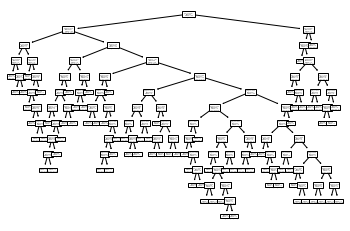

In [23]:
from sklearn import tree
from six import StringIO
import graphviz

clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_size)
tree_size_pred = clf.predict(X_test)
tree.plot_tree(clf)


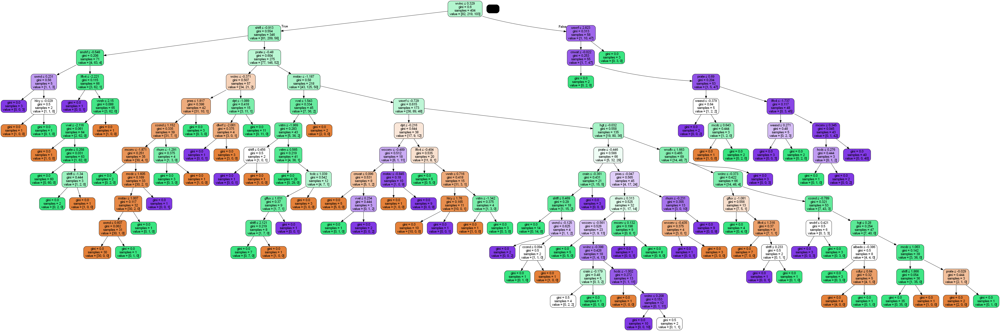

In [24]:
from IPython.display import  Image
import pydotplus
dot_data = StringIO()
size_data = tree.export_graphviz(clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True,
                                 feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('size.png')
Image(graph.create_png())


In [25]:
tree_size_accuracy = metrics.accuracy_score(y_test['size'], tree_size_pred)
print(tree_size_accuracy)

0.47126436781609193


Pruning tree to reduce overfitting my limiting max depth

In [26]:
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X_train, y_size)
tree_size_pred = clf.predict(X_test)
tree_size_accuracy = metrics.accuracy_score(y_test['size'], tree_size_pred)
print(tree_size_accuracy)

0.5344827586206896


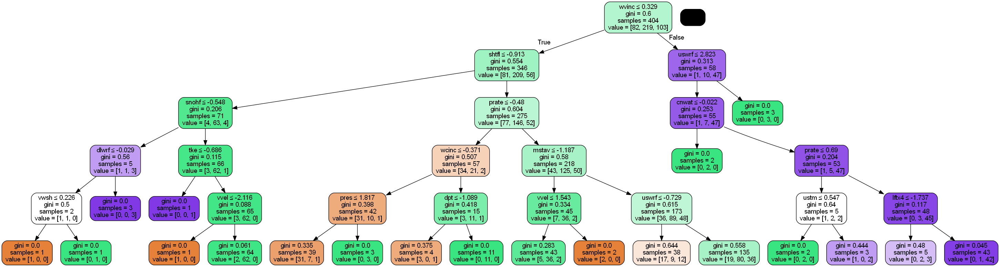

In [27]:
dot_data = StringIO()
size_data = tree.export_graphviz(clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True,
                                 feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('size.png')
Image(graph.create_png())


Reduce dimensionality using PCA to reduce overfitting by the tree

In [28]:
print(len(X_data.columns))

59


In [29]:
from sklearn.decomposition import PCA
from sklearn import preprocessing

pca_var_meas = PCA(n_components=len(X_data.columns), random_state=2023)
pca_var_meas.fit(X_scaled)
X_pca_var_meas = pca_var_meas.transform(X_scaled)
print("Variance in all 59 features (should be 100%): ", sum(pca_var_meas.explained_variance_ratio_ * 100))

Variance in all 59 features (should be 100%):  100.00000000000004


Visualizing which components make up most of variation

In [30]:
pca_var_meas.explained_variance_ratio_ * 100

array([3.44451050e+01, 1.42116334e+01, 8.15866329e+00, 6.74689239e+00,
       4.64957082e+00, 3.70694259e+00, 3.59538187e+00, 2.59524648e+00,
       2.42563507e+00, 1.98662699e+00, 1.54791780e+00, 1.51257996e+00,
       1.46343383e+00, 1.15855786e+00, 1.11118738e+00, 1.06682979e+00,
       9.79467582e-01, 8.61630342e-01, 8.13585752e-01, 7.53135739e-01,
       6.68218252e-01, 6.28976328e-01, 4.79829615e-01, 4.73346404e-01,
       4.16499263e-01, 3.66623943e-01, 3.37549669e-01, 3.09347270e-01,
       2.99643328e-01, 2.47980315e-01, 2.35557159e-01, 1.99869013e-01,
       1.72455925e-01, 1.61771034e-01, 1.48851922e-01, 1.28354153e-01,
       1.20473746e-01, 1.09328465e-01, 1.00583119e-01, 8.34099016e-02,
       7.19361382e-02, 6.17986831e-02, 5.27193903e-02, 5.10591482e-02,
       4.66022936e-02, 4.05685919e-02, 3.69580181e-02, 3.14839167e-02,
       2.77893806e-02, 2.30619288e-02, 2.12012827e-02, 1.41301572e-02,
       1.31822636e-02, 9.57044805e-03, 8.34923390e-03, 6.54224454e-03,
      

In [51]:
df = pd.DataFrame(abs( pca_var_meas.components_ ))

In [53]:
print(df)
df.to_csv("variance.csv")

          0             1             2             3             4   \
0   0.039395  1.200109e-02  6.309797e-02  1.115397e-01  7.316548e-02   
1   0.174791  3.320416e-01  2.403498e-01  4.309310e-02  2.668350e-01   
2   0.114889  2.021707e-02  1.471079e-01  1.717375e-01  3.418154e-02   
3   0.297583  5.510713e-02  2.039905e-01  6.516411e-03  2.288293e-01   
4   0.134071  4.290500e-02  1.235254e-01  8.371239e-02  6.122451e-02   
5   0.016584  7.923650e-02  9.018148e-03  2.349922e-01  3.675409e-02   
6   0.076599  1.243050e-02  1.259774e-02  1.118912e-01  7.870003e-03   
7   0.066159  1.000511e-01  3.169548e-02  1.628042e-01  8.388449e-03   
8   0.072417  1.833953e-02  1.216020e-02  1.783931e-01  8.881670e-02   
9   0.085361  6.987143e-02  1.221343e-01  1.831616e-01  8.104284e-03   
10  0.129395  7.526341e-02  1.716883e-02  5.518007e-02  3.565954e-02   
11  0.083369  2.044141e-02  1.039233e-01  2.279754e-01  4.285754e-02   
12  0.142209  3.623833e-02  6.172091e-03  1.095737e-01  5.338650

First feature alone explains 34% of the variance in the dataset


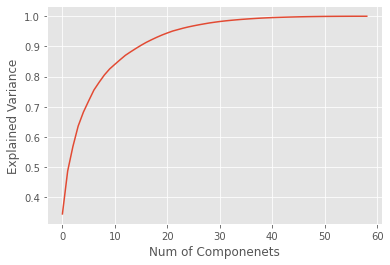

In [31]:
import numpy as np
import matplotlib.pylab as plt
plt.style.use('ggplot')
np.cumsum(pca_var_meas.explained_variance_ratio_ * 100)
plt.plot(np.cumsum(pca_var_meas.explained_variance_ratio_))
plt.xlabel('Num of Componenets')
plt.ylabel('Explained Variance')
plt.savefig('pca_elbow_plot.png', dpi=100)

Understanding results of our dimensionality reduction:
   -   Around 35 features explain roughly 99% of all the variance in our data
   -   Reducing our data to 2D explains roughly only 50% of the variance in our data
   -   3D explains roughly 60%


Now let us reduce our dimensionality to reduce overfitting of our
decision tree while still retaining 99% of our data variance

In [32]:
pca_95 = PCA(n_components=.99, random_state=2023)
pca_95.fit(X_scaled)
X_pca_95 = pca_95.transform(X_scaled)
X_pca_95.shape

## split into train and test
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca_95, Y_data, test_size=0.30)


In [33]:
pca_clf = tree.DecisionTreeClassifier()
pca_clf.fit(X_train_pca, y_size)
pca_y_size_pred = pca_clf.predict(X_test_pca)
tree_size_accuracy = metrics.accuracy_score(y_test['size'], tree_size_pred)
pca_acc = metrics.accuracy_score(y_test['size'], pca_y_size_pred)
print(pca_acc)

0.42528735632183906


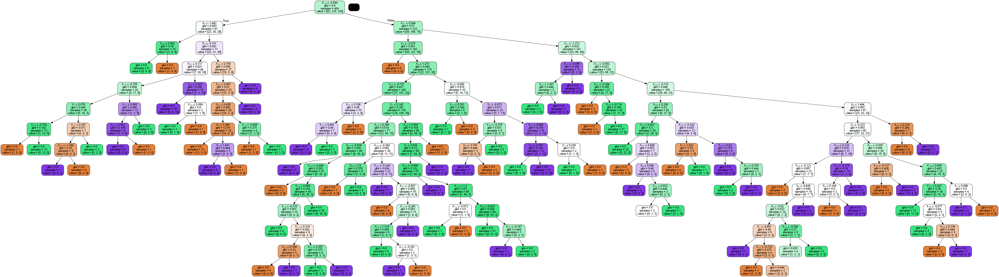

In [34]:
dot_data = StringIO()
size_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('size_pca.png')
Image(graph.create_png())

0.42528735632183906


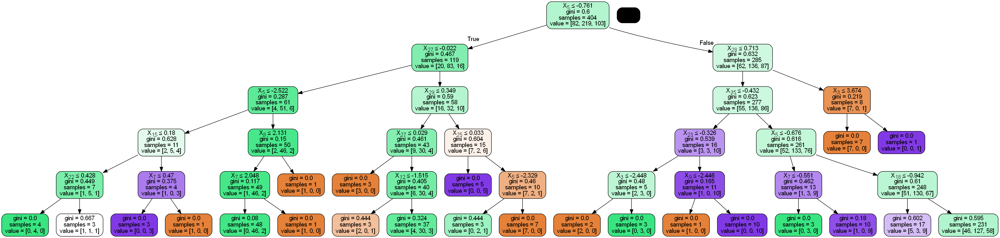

In [35]:
##### PCA 99% of variance and pruning tree with max depth of 5 #####

pca_95 = PCA(n_components=.99, random_state=2023)
pca_95.fit(X_scaled)
X_pca_95 = pca_95.transform(X_scaled)
X_pca_95.shape

## split into train and test
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca_95, Y_data, test_size=0.30)

pca_clf = tree.DecisionTreeClassifier(max_depth=5)
pca_clf.fit(X_train_pca, y_size)
pca_y_size_pred = pca_clf.predict(X_test_pca)
tree_size_accuracy = metrics.accuracy_score(y_test['size'], tree_size_pred)
pca_acc = metrics.accuracy_score(y_test['size'], pca_y_size_pred)
print(pca_acc)

dot_data = StringIO()
size_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('size_pca.png')
Image(graph.create_png())

Likelihoood

avalanche likelihood accuracy:  0.5747126436781609


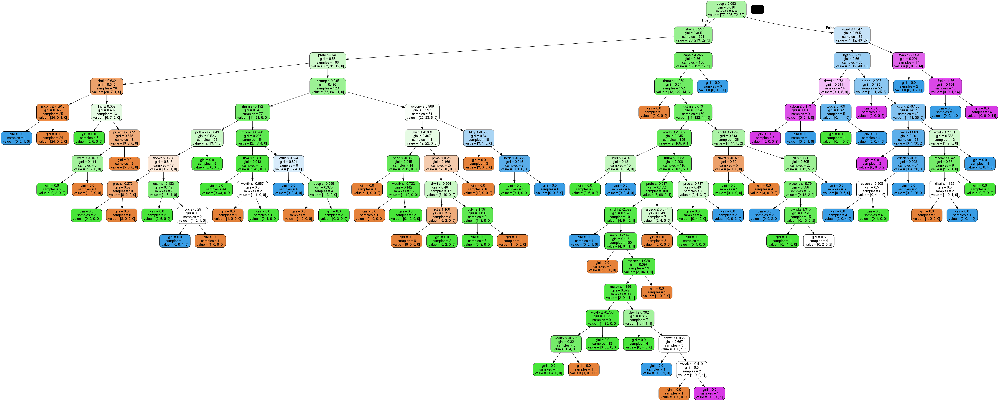

In [36]:
# y_likelihood
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_likelihood)
tree_likelihood_pred = clf.predict(X_test)

## accuracy ##
tree_likelihood_accuracy = metrics.accuracy_score(y_test['likelihood'], tree_likelihood_pred)
print("avalanche likelihood accuracy: ", tree_likelihood_accuracy)


## visualization ##
likelihood_data = tree.export_graphviz(clf, out_file=None)

dot_data = StringIO()
likelihood_data = tree.export_graphviz(clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True,
                                 feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_likelihood.png')
Image(graph.create_png())

avalanche likelihood accuracy:  0.632183908045977


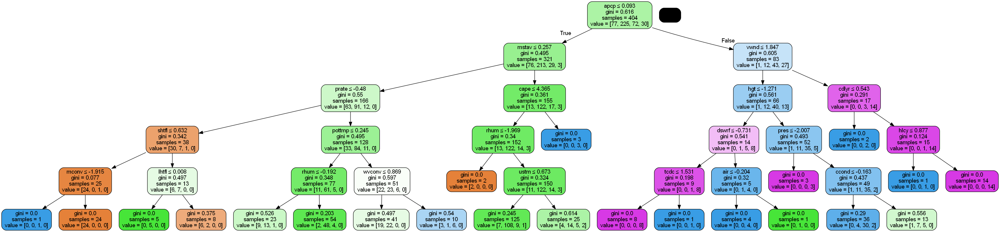

In [37]:
## limiting our max depth ##
# y_likelihood
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X_train, y_likelihood)
tree_likelihood_pred = clf.predict(X_test)

## accuracy ##
tree_likelihood_accuracy = metrics.accuracy_score(y_test['likelihood'], tree_likelihood_pred)
print("avalanche likelihood accuracy: ", tree_likelihood_accuracy)


## visualization ##
likelihood_data = tree.export_graphviz(clf, out_file=None)

dot_data = StringIO()
likelihood_data = tree.export_graphviz(clf, out_file=dot_data,
                                       filled=True, rounded=True,
                                       special_characters=True,
                                       feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_likelihood.png')
Image(graph.create_png())

avalanche likelihood accuracy:  0.6379310344827587


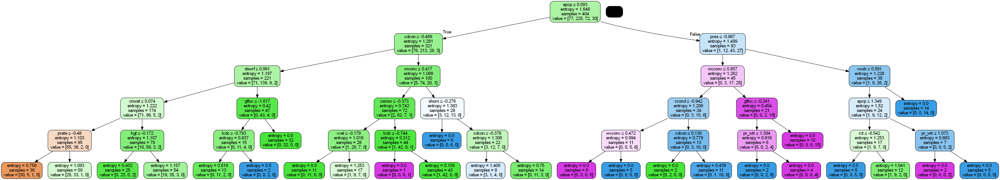

In [38]:
## using entropy ##
## limiting our max depth ##
# y_likelihood
clf = tree.DecisionTreeClassifier(criterion="entropy", max_depth=5)
clf = clf.fit(X_train, y_likelihood)
tree_likelihood_pred = clf.predict(X_test)

## accuracy ##
tree_likelihood_accuracy = metrics.accuracy_score(y_test['likelihood'], tree_likelihood_pred)
print("avalanche likelihood accuracy: ", tree_likelihood_accuracy)


## visualization ##
likelihood_data = tree.export_graphviz(clf, out_file=None)

dot_data = StringIO()
likelihood_data = tree.export_graphviz(clf, out_file=dot_data,
                                       filled=True, rounded=True,
                                       special_characters=True,
                                       feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_likelihood.png')
Image(graph.create_png())

Unpruned Accuracy:  0.367816091954023
Accuracy with max depth of 5:  0.43103448275862066


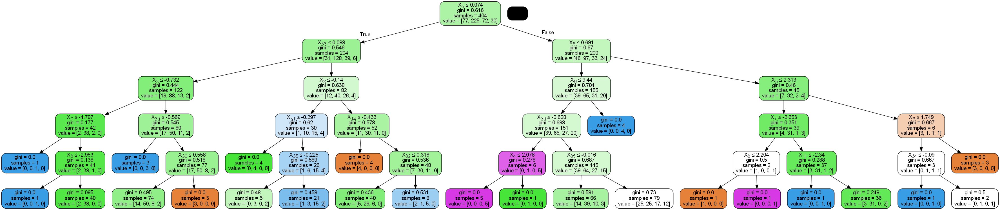

In [39]:
##### PCA pruned and non pruned #####
##### ***** this encompasses all the code needed to train a decision tree, fit the model,
##### produce accuracy scores and a visualization
##### can optimize our code to loop through the different
##### y predictions we want for more efficienct readable code


# pca_95 = PCA(n_components=.99, random_state=2023)
# pca_95.fit(X_scaled)
# X_pca_95 = pca_95.transform(X_scaled)
# X_pca_95.shape
#
# ## split into train and test
# X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca_95, Y_data, test_size=0.30)

pca_clf = tree.DecisionTreeClassifier()
pca_clf.fit(X_train_pca, y_likelihood)
pca_y_like_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['likelihood'], pca_y_like_pred)
print("Unpruned Accuracy: ", pca_acc)

dot_data = StringIO()
pca_like_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('like_pca.png')
Image(graph.create_png())

## now with a max depth ( pruned )
pca_clf = tree.DecisionTreeClassifier(max_depth=5)
pca_clf.fit(X_train_pca, y_likelihood)
pca_y_like_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['likelihood'], pca_y_like_pred)
print("Accuracy with max depth of 5: ", pca_acc)

dot_data = StringIO()
pca_like_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('like_pca.png')
Image(graph.create_png())

Problem Type

Problem type accuracy using decision trees:  0.7011494252873564
Reducing dimensionality using PCA: 
Accuracy after reducing dimensionality for problem type:  0.41379310344827586
Tree using PCA: 

(process:21440): GLib-GIO-WARNING **: 17:35:44.802: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2303.17.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

(process:21440): GLib-GIO-WARNING **: 17:35:44.839: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.6.0.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs



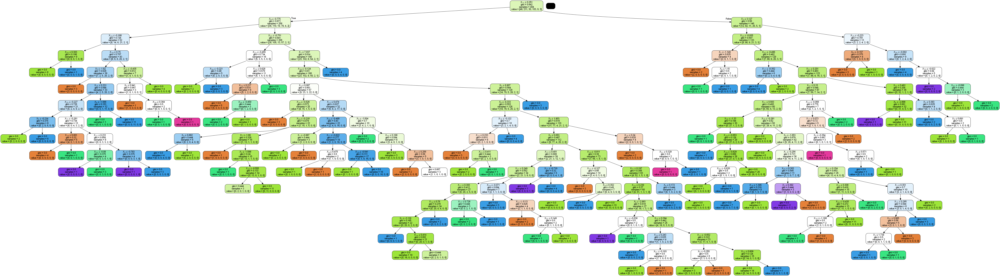

In [40]:
## Basic decision tree ##

clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_type)
tree_type_pred = clf.predict(X_test)
type_data = tree.export_graphviz(clf, out_file=None)
graph = graphviz.Source(type_data)
graph

## visualizations ##
dot_data = StringIO()
type_data = tree.export_graphviz(clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True,
                                 feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('problem_type.png')
Image(graph.create_png())

## accuracy score ##
tree_type_accuracy = metrics.accuracy_score(y_test['type'], tree_type_pred)
print("Problem type accuracy using decision trees: ", tree_type_accuracy)

## reducing dimensionality to retain 99% of variance within dataset ##
print("Reducing dimensionality using PCA: ")
pca_clf = tree.DecisionTreeClassifier()
pca_clf.fit(X_train_pca, y_type)
pca_y_type_pred = pca_clf.predict(X_test_pca)
tree_size_accuracy = metrics.accuracy_score(y_test['type'], tree_type_pred)
pca_acc = metrics.accuracy_score(y_test['type'], pca_y_size_pred)
print("Accuracy after reducing dimensionality for problem type: ", pca_acc)


## visualization ##
print("Tree using PCA: ")

dot_data = StringIO()
type_data_pca = tree.export_graphviz(pca_clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True,
                                 )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('problem_type_pca.png')
Image(graph.create_png())


Accuracy with max depth of 5:  0.46551724137931033


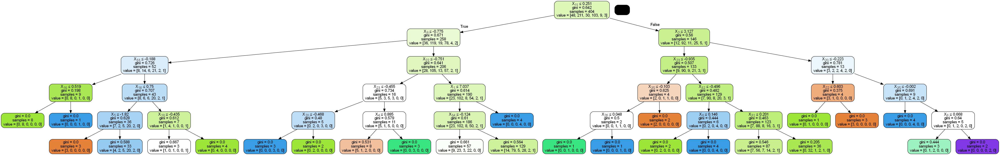

In [41]:
## now with a max depth ( pruned ) ( PCA )
pca_clf = tree.DecisionTreeClassifier(max_depth=5)
pca_clf.fit(X_train_pca, y_type)
pca_y_type_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['type'], pca_y_type_pred)
print("Accuracy with max depth of 5: ", pca_acc)

dot_data = StringIO()
pca_type_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                     filled=True, rounded=True,
                                     special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('type_pca.png')
Image(graph.create_png())

Problem Type restricting max depth

Problem type accuracy using decision trees with max depth of 5:  0.6896551724137931


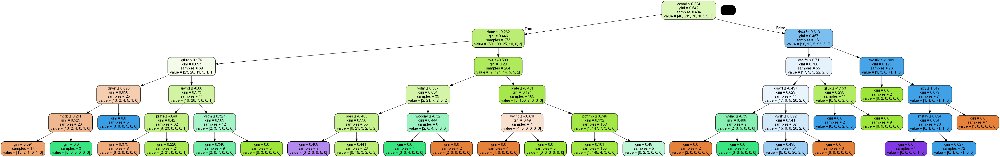

In [42]:
### setting max depths
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X_train, y_type)
tree_type_pred = clf.predict(X_test)
type_data = tree.export_graphviz(clf, out_file=None)
graph = graphviz.Source(type_data)
graph

## visualizations ##
tree_type_accuracy = metrics.accuracy_score(y_test['type'], tree_type_pred)
print("Problem type accuracy using decision trees with max depth of 5: ", tree_type_accuracy)


dot_data = StringIO()
type_data = tree.export_graphviz(clf, out_file=dot_data,
                                 filled=True, rounded=True,
                                 special_characters=True,
                                 feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('problem_type_depth_5.png')
Image(graph.create_png())

Reducing dimensionality using PCA: 
Accuracy after reducing dimensionality for problem type:  0.41379310344827586
Tree using PCA: 


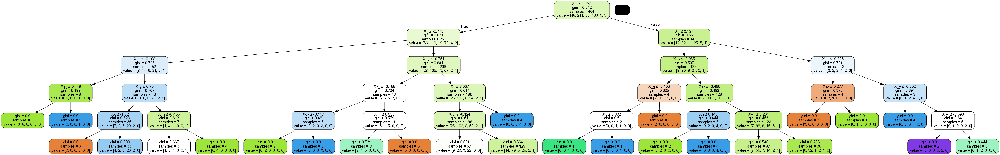

In [43]:
## now lets restrict the depth of our tree
##  when reducing our dimensionality
##      preventing OVERFITTING

print("Reducing dimensionality using PCA: ")
pca_clf = tree.DecisionTreeClassifier(max_depth=5)
pca_clf.fit(X_train_pca, y_type)
pca_y_type_pred = pca_clf.predict(X_test_pca)
tree_size_accuracy = metrics.accuracy_score(y_test['type'], tree_type_pred)
pca_acc = metrics.accuracy_score(y_test['type'], pca_y_size_pred)
print("Accuracy after reducing dimensionality for problem type: ", pca_acc)

print("Tree using PCA: ")

dot_data = StringIO()
type_data_pca = tree.export_graphviz(pca_clf, out_file=dot_data,
                                     filled=True, rounded=True,
                                     special_characters=True,
                                     )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('problem_type_pca_5.png')
Image(graph.create_png())


Conclusions:
   - Reducing our dimensionality, while making our algorithm marginally quicker and more efficient, reduces our accuracy substantially
      - With avalanche forecasting, accuracy trumps efficiency
   - Reducing the max depth of the tree increases both accuracy and efficiency marginally
      - Further research can find optimal max depth for these decision trees
            - will probably vary depending on the feature being predicted


avalanche above treeline accuracy:  0.6264367816091954
avalanche near treeline accuracy:  0.5747126436781609
avalanche below treeline accuracy:  0.5517241379310345


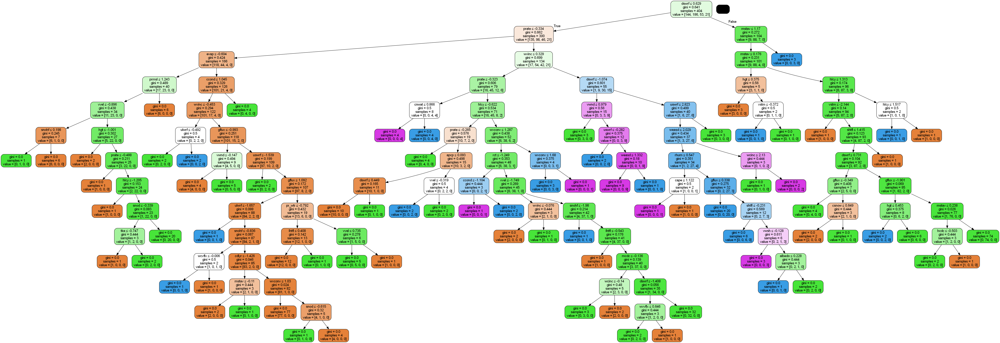

In [44]:
##### ELEVATION PREDICTIONS #####
# elevation y variable feature list:
# y_atl
# y_ntl
# y_btl

## above treeline ##

clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_atl)
tree_atl_pred = clf.predict(X_test)

## accuracy ##
tree_atl_accuracy = metrics.accuracy_score(y_test['atl'], tree_atl_pred)
print("avalanche above treeline accuracy: ", tree_atl_accuracy)

## visualization ##
dot_data = StringIO()
atl_data = tree.export_graphviz(clf, out_file=dot_data,
                                       filled=True, rounded=True,
                                       special_characters=True,
                                       feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_above_treeline.png')
Image(graph.create_png())

## end above treeline ##

## near treeline ##

clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_ntl)
tree_ntl_pred = clf.predict(X_test)

## accuracy ##
tree_ntl_accuracy = metrics.accuracy_score(y_test['ntl'], tree_ntl_pred)
print("avalanche near treeline accuracy: ", tree_ntl_accuracy)

## visualization ##
dot_data = StringIO()
ntl_data = tree.export_graphviz(clf, out_file=dot_data,
                                filled=True, rounded=True,
                                special_characters=True,
                                feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_near_treeline.png')
Image(graph.create_png())

## end near treeline ##

## below treeline ##

clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_btl)
tree_btl_pred = clf.predict(X_test)

## accuracy ##
tree_btl_accuracy = metrics.accuracy_score(y_test['btl'], tree_btl_pred)
print("avalanche below treeline accuracy: ", tree_btl_accuracy)

## visualization ##
dot_data = StringIO()
btl_data = tree.export_graphviz(clf, out_file=dot_data,
                                filled=True, rounded=True,
                                special_characters=True,
                                feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_below_treeline.png')
Image(graph.create_png())

## end below treeline ##

##### ASPECT PREDICTIONS #####
# y_train_asp = y_train.iloc[:, 6:14]
# y_test_asp = y_test.iloc[:, 6:14]
#
# for feature in aspect:
#     model = svm.SVC()
#     model.fit(X_train, y_train_asp[feature])
#     preds = model.predict(X_test)
#     score = accuracy_score(y_test[feature], preds)
#     print(feature + ": ", score)

avalanche above treeline accuracy:  0.6264367816091954
avalanche near treeline accuracy:  0.6379310344827587
avalanche below treeline accuracy:  0.5977011494252874


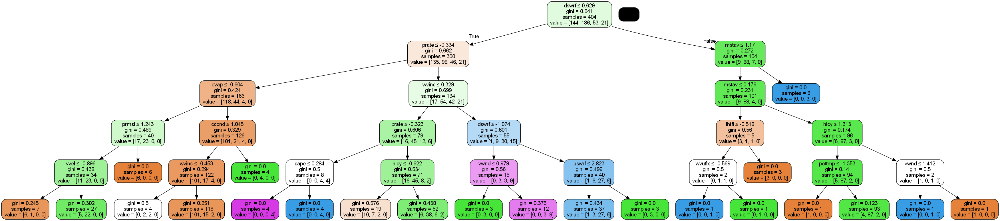

In [45]:
##### ELEVATION PREDICTIONS restricting tree depth #####
# elevation y variable feature list:
# y_atl
# y_ntl
# y_btl

## above treeline ##

clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X_train, y_atl)
tree_atl_pred = clf.predict(X_test)

## accuracy ##
tree_atl_accuracy = metrics.accuracy_score(y_test['atl'], tree_atl_pred)
print("avalanche above treeline accuracy: ", tree_atl_accuracy)

## visualization ##
dot_data = StringIO()
atl_data = tree.export_graphviz(clf, out_file=dot_data,
                                filled=True, rounded=True,
                                special_characters=True,
                                feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_above_treeline_d5.png')
Image(graph.create_png())

## end above treeline ##

## near treeline ##

clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X_train, y_ntl)
tree_ntl_pred = clf.predict(X_test)

## accuracy ##
tree_ntl_accuracy = metrics.accuracy_score(y_test['ntl'], tree_ntl_pred)
print("avalanche near treeline accuracy: ", tree_ntl_accuracy)

## visualization ##
dot_data = StringIO()
ntl_data = tree.export_graphviz(clf, out_file=dot_data,
                                filled=True, rounded=True,
                                special_characters=True,
                                feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_near_treeline_d5.png')
Image(graph.create_png())

## end near treeline ##

## below treeline ##

clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X_train, y_btl)
tree_btl_pred = clf.predict(X_test)

## accuracy ##
tree_btl_accuracy = metrics.accuracy_score(y_test['btl'], tree_btl_pred)
print("avalanche below treeline accuracy: ", tree_btl_accuracy)

## visualization ##
dot_data = StringIO()
btl_data = tree.export_graphviz(clf, out_file=dot_data,
                                filled=True, rounded=True,
                                special_characters=True,
                                feature_names=X_data.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('avalanche_below_treeline_d5.png')
Image(graph.create_png())

## end below treeline ##


Above Treeline PCA: 
Unpruned Accuracy:  0.40229885057471265
Accuracy with max depth of 5:  0.4367816091954023
Near Treeline PCA: 
Unpruned Accuracy:  0.3160919540229885
Accuracy with max depth of 5:  0.47126436781609193
Below Treeline PCA: 
Unpruned Accuracy:  0.3735632183908046

(process:16132): GLib-GIO-WARNING **: 17:36:15.894: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2303.17.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

(process:16132): GLib-GIO-WARNING **: 17:36:15.913: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.6.0.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs


(process:27048): GLib-GIO-WARNING **: 17:36:17.145: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2303.17.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

(process:27048): GLib-GIO-WARNING **: 17:36:17.163: Une

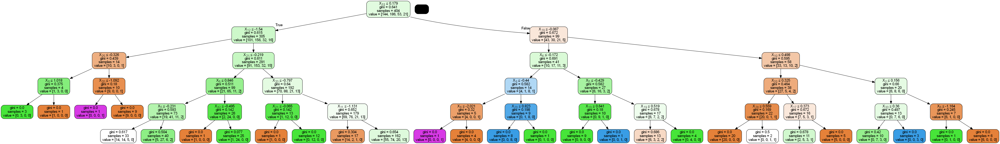

In [46]:
##### Elevation predictions utilizing PCA with 99% of variance

## Above Treeline ##

print("Above Treeline PCA: ")
pca_clf = tree.DecisionTreeClassifier()
pca_clf.fit(X_train_pca, y_atl)
pca_y_atl_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['atl'], pca_y_atl_pred)
print("Unpruned Accuracy: ", pca_acc)

dot_data = StringIO()
pca_atl_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                     filled=True, rounded=True,
                                     special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('atl_pca.png')
Image(graph.create_png())

## now with a max depth ( pruned )
pca_clf = tree.DecisionTreeClassifier(max_depth=5)
pca_clf.fit(X_train_pca, y_atl)
pca_y_atl_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['atl'], pca_y_atl_pred)
print("Accuracy with max depth of 5: ", pca_acc)

dot_data = StringIO()
pca_atl_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                     filled=True, rounded=True,
                                     special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('atl_pca.png')
Image(graph.create_png())




## Near Treeline ##

print("Near Treeline PCA: ")
pca_clf = tree.DecisionTreeClassifier()
pca_clf.fit(X_train_pca, y_ntl)
pca_y_ntl_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['ntl'], pca_y_ntl_pred)
print("Unpruned Accuracy: ", pca_acc)

dot_data = StringIO()
pca_ntl_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                    filled=True, rounded=True,
                                    special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('ntl_pca.png')
Image(graph.create_png())

## now with a max depth ( pruned )
pca_clf = tree.DecisionTreeClassifier(max_depth=5)
pca_clf.fit(X_train_pca, y_ntl)
pca_y_ntl_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['ntl'], pca_y_ntl_pred)
print("Accuracy with max depth of 5: ", pca_acc)

dot_data = StringIO()
pca_ntl_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                    filled=True, rounded=True,
                                    special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('ntl_pca.png')
Image(graph.create_png())




## Below Treeline ##

print("Below Treeline PCA: ")
pca_clf = tree.DecisionTreeClassifier()
pca_clf.fit(X_train_pca, y_btl)
pca_y_btl_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['btl'], pca_y_btl_pred)
print("Unpruned Accuracy: ", pca_acc)

dot_data = StringIO()
pca_btl_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                    filled=True, rounded=True,
                                    special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('btl_pca.png')
Image(graph.create_png())

## now with a max depth ( pruned )
pca_clf = tree.DecisionTreeClassifier(max_depth=5)
pca_clf.fit(X_train_pca, y_btl)
pca_y_btl_pred = pca_clf.predict(X_test_pca)
pca_acc = metrics.accuracy_score(y_test['btl'], pca_y_btl_pred)
print("Accuracy with max depth of 5: ", pca_acc)

dot_data = StringIO()
pca_btl_data = tree.export_graphviz(pca_clf, out_file=dot_data,
                                    filled=True, rounded=True,
                                    special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('btl_pca.png')
Image(graph.create_png())

In [47]:
##### Predictions on aspects #####
# Format test set.
aspect = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
y_train_asp = y_train.iloc[:, 6:14]
y_test_asp = y_test.iloc[:, 6:14]

for feature in aspect:
    ## model ##
    clf = tree.DecisionTreeClassifier()
    clf = clf.fit(X_train, y_train_asp[feature])
    tree_asp_pred = clf.predict(X_test)

    ## accuracy ##
    tree_asp_accuracy = metrics.accuracy_score(y_test[feature], tree_asp_pred)
    print("avalanche on aspect", feature, ": ", tree_asp_accuracy)


## limiting depth of tree ##
print("After limiting depth of tree: ")
for feature in aspect:
    ## model ##
    clf = tree.DecisionTreeClassifier(max_depth=5)
    clf = clf.fit(X_train, y_train_asp[feature])
    tree_asp_pred = clf.predict(X_test)

    ## accuracy ##
    tree_asp_accuracy = metrics.accuracy_score(y_test[feature], tree_asp_pred)
    print("avalanche on aspect", feature, ": ", tree_asp_accuracy)

    # model = svm.SVC()
    # model.fit(X_train, y_train_asp[feature])
    # preds = model.predict(X_test)
    # score = accuracy_score(y_test[feature], preds)
    # print(feature + ": ", score)


avalanche on aspect N :  0.8735632183908046
avalanche on aspect NE :  0.896551724137931
avalanche on aspect E :  0.8735632183908046
avalanche on aspect SE :  0.8793103448275862
avalanche on aspect S :  0.7528735632183908
avalanche on aspect SW :  0.8045977011494253
avalanche on aspect W :  0.7126436781609196
avalanche on aspect NW :  0.8793103448275862
After limiting depth of tree: 
avalanche on aspect N :  0.896551724137931
avalanche on aspect NE :  0.9310344827586207
avalanche on aspect E :  0.896551724137931
avalanche on aspect SE :  0.9080459770114943
avalanche on aspect S :  0.7816091954022989
avalanche on aspect SW :  0.8218390804597702
avalanche on aspect W :  0.7758620689655172
avalanche on aspect NW :  0.896551724137931


In [48]:
##### Aspect with PCA #####


aspect = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
y_train_asp = y_train.iloc[:, 6:14]
y_test_asp = y_test.iloc[:, 6:14]
iteration = 0

for feature in aspect:
    print("For aspect ", aspect[iteration])

    pca_clf = tree.DecisionTreeClassifier()
    pca_clf.fit(X_train_pca, y_train_asp[feature])
    pca_y_asp_pred = pca_clf.predict(X_test_pca)
    pca_acc = metrics.accuracy_score(y_test_asp[feature], pca_y_asp_pred)
    print("Unpruned Accuracy: ", pca_acc)

    ## now with a max depth ( pruned )
    pca_clf = tree.DecisionTreeClassifier(max_depth=5)
    pca_clf.fit(X_train_pca, y_train_asp[feature])
    pca_y_asp_pred = pca_clf.predict(X_test_pca)
    pca_acc = metrics.accuracy_score(y_test_asp[feature], pca_y_asp_pred)
    print("Accuracy with max depth of 5: ", pca_acc)

    iteration += 1

For aspect  N
Unpruned Accuracy:  0.8390804597701149
Accuracy with max depth of 5:  0.9080459770114943
For aspect  NE
Unpruned Accuracy:  0.7586206896551724
Accuracy with max depth of 5:  0.8735632183908046
For aspect  E
Unpruned Accuracy:  0.7816091954022989
Accuracy with max depth of 5:  0.8793103448275862
For aspect  SE
Unpruned Accuracy:  0.7528735632183908
Accuracy with max depth of 5:  0.8505747126436781
For aspect  S
Unpruned Accuracy:  0.47701149425287354
Accuracy with max depth of 5:  0.5
For aspect  SW
Unpruned Accuracy:  0.5459770114942529
Accuracy with max depth of 5:  0.5517241379310345
For aspect  W
Unpruned Accuracy:  0.5229885057471264
Accuracy with max depth of 5:  0.5689655172413793
For aspect  NW
Unpruned Accuracy:  0.867816091954023
Accuracy with max depth of 5:  0.9252873563218391


In [49]:
print(X_data.columns)

Index(['weasd', 'air', 'albedo', 'lftx4', 'ccond', 'cfrzr', 'cicep', 'crain',
       'csnow', 'cape', 'cdcon', 'acpcp', 'dpt', 'dlwrf', 'dswrf', 'evap',
       'hgt', 'gflux', 'hcdc', 'mconv', 'lhtfl', 'lcdc', 'prmsl', 'mcdc',
       'mstav', 'cdlyr', 'cnwat', 'pottmp', 'pr_wtr', 'apcp', 'prate', 'pres',
       'vvel', 'rhum', 'shtfl', 'snohf', 'snowc', 'snod', 'y', 'shum', 'hlcy',
       'rct', 'tcdc', 'tke', 'ulwrf', 'uswrf', 'ustm', 'uwnd', 'vwsh', 'vstm',
       'vwnd', 'wcinc', 'wcconv', 'wcvflx', 'wcuflx', 'wvinc', 'wvconv',
       'wvvflx', 'wvuflx'],
      dtype='object')
